In [10]:
import os
import shutil
import random
from datasets import load_dataset
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from ultralytics import YOLO

c:\Users\henry_f4yg7pl\Documents\GitHub\selfdriving\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
# import os
# import urllib.request
# import zipfile

# # Create folders
# os.makedirs("coco/images", exist_ok=True)
# os.makedirs("coco/annotations", exist_ok=True)

# files = {
#     "train2017.zip": "http://images.cocodataset.org/zips/train2017.zip",
#     "val2017.zip": "http://images.cocodataset.org/zips/val2017.zip",
#     "annotations_trainval2017.zip":
#         "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
# }

# # Download files
# for filename, url in files.items():
#     print(f"Downloading {filename}...")
#     urllib.request.urlretrieve(url, filename)
#     print(f"Finished {filename}")

# # Extract train images
# with zipfile.ZipFile("train2017.zip", 'r') as zip_ref:
#     zip_ref.extractall("coco/images")

# # Extract val images
# with zipfile.ZipFile("val2017.zip", 'r') as zip_ref:
#     zip_ref.extractall("coco/images")

# # Extract annotations
# with zipfile.ZipFile("annotations_trainval2017.zip", 'r') as zip_ref:
#     zip_ref.extractall("coco")

# print("COCO dataset downloaded and extracted.")

Finished train2017.zip
Finished val2017.zip
Finished annotations_trainval2017.zip
COCO dataset downloaded and extracted.


In [2]:
dataset = load_dataset("PrashantDixit0/TT-100K")

# Create folders
splits = ["train", "val", "test"]

for split in splits:
    os.makedirs(f"dataset/images/{split}", exist_ok=True)
    os.makedirs(f"dataset/labels/{split}", exist_ok=True)

# Build class mapping
all_classes = set()

for split in splits:
    for sample in dataset[split]:
        for obj in sample["objects"]:
            all_classes.add(obj["category"])

all_classes = sorted(list(all_classes))
class_to_id = {cls: idx for idx, cls in enumerate(all_classes)}

print(f"Number of classes: {len(all_classes)}")

Number of classes: 161


In [25]:
dataset["train"]["objects"][0]

[{'category': 'pl40',
  'bbox': [1296.5999755859375,
   932.9500122070312,
   23.290000915527344,
   24.43000030517578]}]

In [3]:
print(sorted(list(all_classes)))

['i1', 'i10', 'i11', 'i12', 'i13', 'i14', 'i15', 'i2', 'i3', 'i4', 'i5', 'il100', 'il110', 'il60', 'il80', 'io', 'ip', 'p1', 'p10', 'p11', 'p12', 'p13', 'p14', 'p15', 'p16', 'p17', 'p18', 'p19', 'p2', 'p20', 'p21', 'p22', 'p23', 'p24', 'p25', 'p26', 'p27', 'p28', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'pa10', 'pa12', 'pa13', 'pa14', 'pa8', 'pb', 'pc', 'pg', 'ph1.5', 'ph2', 'ph2.1', 'ph2.2', 'ph2.4', 'ph2.5', 'ph2.8', 'ph2.9', 'ph3', 'ph3.2', 'ph3.5', 'ph3.8', 'ph4', 'ph4.2', 'ph4.3', 'ph4.5', 'ph4.8', 'ph5', 'ph5.3', 'ph5.5', 'pl0', 'pl10', 'pl100', 'pl110', 'pl120', 'pl15', 'pl20', 'pl25', 'pl30', 'pl35', 'pl4', 'pl40', 'pl5', 'pl50', 'pl60', 'pl65', 'pl70', 'pl80', 'pl90', 'pm10', 'pm13', 'pm15', 'pm2', 'pm20', 'pm25', 'pm30', 'pm35', 'pm40', 'pm46', 'pm5', 'pm50', 'pm55', 'pm8', 'pn', 'pne', 'po', 'pr10', 'pr100', 'pr20', 'pr30', 'pr40', 'pr45', 'pr50', 'pr60', 'pr70', 'pr80', 'ps', 'w1', 'w10', 'w12', 'w13', 'w16', 'w18', 'w2', 'w20', 'w21', 'w22', 'w24', 'w28', 'w3', 'w30', 'w3

In [222]:
from collections import Counter

counter = Counter()

for split in ["train", "val", "test"]:
    for sample in dataset[split]:
        for obj in sample["objects"]:
            counter[obj["category"]] += 1

print(counter.most_common(30))

[('pn', 2997), ('pne', 2249), ('i5', 1663), ('p11', 1485), ('pl40', 1346), ('po', 1131), ('pl50', 1031), ('pl80', 875), ('io', 854), ('pl60', 810), ('p26', 759), ('i4', 733), ('pl100', 671), ('pl30', 588), ('pl5', 498), ('il60', 483), ('i2', 440), ('p5', 396), ('w57', 393), ('p10', 335), ('ip', 319), ('pl120', 296), ('il80', 295), ('p23', 271), ('pr40', 199), ('w59', 185), ('ph4.5', 182), ('p12', 177), ('p3', 170), ('w55', 169)]


In [531]:
TARGET_MAP = {
    # 🚗 speed limits (challenge)
    "pl10": "speed_10",
    "pl20": "speed_20",
    "pl30": "speed_30",

    # 🔵 information signs (FULL COVERAGE)
    # "i1": "info_1",   # pedestrian path
    # "i2": "info_2",
    # "i3": "info_3",   # roundabout
    # "i4": "info_4",
    # "i5": "info_5",
    # "i10": "info_10", # right
    # "i11": "info_11",
    "i12": "left_turn",   # left <- challenge
    # "i13": "info_13", # straight
    # "i14": "info_14", # straight + right
    # "i15": "info_15", # straight + left

    # # 🔵 informational speed / direction signs
    # "il60": "info_speed_60",
    # "il80": "info_speed_80",
    # "il100": "info_speed_100",
    # "il110": "info_speed_110",

    # # 🔵 other info groups
    # "io": "info_other",
    # "ip": "info_plate",

    # # 🟥 prohibitory (keep minimal if needed)
    # "p10": "no_entry_10",
    # "p11": "no_entry_11",
    # "p5": "no_entry_5",
}

class_names = list(TARGET_MAP.values())
class_to_id = {c: i for i, c in enumerate(class_names)}

In [535]:
import os
import random
import shutil
from collections import defaultdict
from io import BytesIO

from datasets import load_dataset
from PIL import Image

# =========================================================
# CONFIG
# =========================================================

TARGET_MAP = {
    "pl10": "speed_10",
    "pl20": "speed_20",
    "pl30": "speed_30",
    "i12": "left_turn",
}

TARGET_PER_CLASS = 100   # change to 50 if needed

OUTPUT_DIR = "mini_dataset"

# =========================================================
# LOAD DATASET
# =========================================================

dataset = load_dataset("PrashantDixit0/TT-100K")

# =========================================================
# BUILD CLASS ID MAP
# =========================================================

class_names = sorted(set(TARGET_MAP.values()))
class_to_id = {cls: idx for idx, cls in enumerate(class_names)}

print(class_to_id)

# =========================================================
# CLEAN OUTPUT FOLDERS
# =========================================================

for split in ["train", "val", "test"]:

    img_dir = f"{OUTPUT_DIR}/images/{split}"
    lbl_dir = f"{OUTPUT_DIR}/labels/{split}"

    if os.path.exists(img_dir):
        shutil.rmtree(img_dir)

    if os.path.exists(lbl_dir):
        shutil.rmtree(lbl_dir)

    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(lbl_dir, exist_ok=True)

# =========================================================
# COLLECT SAMPLES PER CLASS
# =========================================================

samples_per_class = defaultdict(list)

for split in ["train", "val", "test"]:

    for sample in dataset[split]:

        labels_in_image = set()

        for obj in sample["objects"]:

            cls = obj["category"]

            if cls in TARGET_MAP:
                labels_in_image.add(cls)

        for cls in labels_in_image:
            samples_per_class[cls].append((split, sample))

# =========================================================
# PRINT ORIGINAL COUNTS
# =========================================================

print("\nOriginal class counts:")

for cls in TARGET_MAP:
    print(cls, len(samples_per_class[cls]))

# =========================================================
# SELECT BALANCED SUBSET
# =========================================================

selected_samples = []

for cls in TARGET_MAP:

    cls_samples = samples_per_class[cls]

    # oversample if too small
    if len(cls_samples) < TARGET_PER_CLASS:
        cls_samples = random.choices(
            cls_samples,
            k=TARGET_PER_CLASS
        )

    else:
        cls_samples = random.sample(
            cls_samples,
            TARGET_PER_CLASS
        )

    selected_samples.extend(cls_samples)

# =========================================================
# REMOVE DUPLICATES
# =========================================================

unique_samples = {}

for split, sample in selected_samples:
    image_id = sample["image_id"]

    unique_samples[image_id] = (split, sample)

selected_samples = list(unique_samples.values())

print(f"\nFinal unique images: {len(selected_samples)}")

# =========================================================
# COCO -> YOLO
# =========================================================

def coco_to_yolo(x, y, w, h, img_w, img_h):

    x_center = (x + w / 2) / img_w
    y_center = (y + h / 2) / img_h

    w_norm = w / img_w
    h_norm = h / img_h

    return x_center, y_center, w_norm, h_norm

# =========================================================
# SAVE DATASET
# =========================================================

final_counter = defaultdict(int)

for split, sample in selected_samples:

    image = Image.open(BytesIO(sample["image"]["bytes"]))

    img_w, img_h = image.size

    image_id = sample["image_id"]

    label_lines = []

    for obj in sample["objects"]:

        cls = obj["category"]

        if cls not in TARGET_MAP:
            continue

        class_name = TARGET_MAP[cls]
        class_id = class_to_id[class_name]

        x, y, w, h = obj["bbox"]

        if w <= 0 or h <= 0:
            continue

        x_center, y_center, w_norm, h_norm = coco_to_yolo(
            x, y, w, h,
            img_w, img_h
        )

        if not (0 <= x_center <= 1 and 0 <= y_center <= 1):
            continue

        label_lines.append(
            f"{class_id} {x_center} {y_center} {w_norm} {h_norm}"
        )

        final_counter[class_name] += 1

    if len(label_lines) == 0:
        continue

    img_dir = f"{OUTPUT_DIR}/images/{split}"
    lbl_dir = f"{OUTPUT_DIR}/labels/{split}"

    image.save(f"{img_dir}/{image_id}.jpg")

    with open(f"{lbl_dir}/{image_id}.txt", "w") as f:
        f.write("\n".join(label_lines))

# =========================================================
# FINAL COUNTS
# =========================================================

print("\nFinal label counts:")

for cls, count in final_counter.items():
    print(cls, count)

# =========================================================
# GENERATE data.yaml
# =========================================================

yaml_text = f"""
path: {OUTPUT_DIR}

train: images/train
val: images/val
test: images/test

names:
"""

for idx, cls in enumerate(class_names):
    yaml_text += f"  {idx}: {cls}\n"

with open(f"{OUTPUT_DIR}/data.yaml", "w") as f:
    f.write(yaml_text)

print("\nDataset build complete.")
print(f"Saved to: {OUTPUT_DIR}")

{'left_turn': 0, 'speed_10': 1, 'speed_20': 2, 'speed_30': 3}

Original class counts:
pl10 35
pl20 152
pl30 585
i12 13

Final unique images: 246

Final label counts:
speed_10 36
speed_30 105
speed_20 100
left_turn 17

Dataset build complete.
Saved to: mini_dataset


In [544]:
import os
import shutil

# =========================================================
# CONFIG
# =========================================================

ROB_ROOT = "roboflow_data/Labeling.yolo26 (linksaf)/train"

IMG_IN = os.path.join(ROB_ROOT, "images")
LBL_IN = os.path.join(ROB_ROOT, "labels")

OUT_ROOT = "fused_dataset"

IMG_OUT = os.path.join(OUT_ROOT, "images/train")
LBL_OUT = os.path.join(OUT_ROOT, "labels/train")

os.makedirs(IMG_OUT, exist_ok=True)
os.makedirs(LBL_OUT, exist_ok=True)

# Roboflow class mapping (from your data.yaml)
ROB_NAMES = ['auto', 'linksaf', 'rood', 'snelheidsbord', 'stop']
KEEP_CLASS_ID = ROB_NAMES.index("linksaf")  # SAFE way

# Your global YOLO class ID
LEFT_TURN_ID = 3

# =========================================================
# PIPELINE
# =========================================================

total_files = 0
kept_images = 0

for file in os.listdir(LBL_IN):

    if not file.endswith(".txt"):
        continue

    total_files += 1

    label_path = os.path.join(LBL_IN, file)

    with open(label_path, "r") as f:
        lines = f.readlines()

    new_lines = []
    has_left_turn = False

    # =====================================================
    # KEEP ALL BOXES, ONLY REMAP linksaf
    # =====================================================
    for line in lines:
        parts = line.strip().split()
        cls_id = int(parts[0])

        if cls_id == KEEP_CLASS_ID:
            has_left_turn = True

            # remap to your class
            new_lines.append(
                " ".join([str(LEFT_TURN_ID)] + parts[1:])
            )

        else:
            # ignore other classes (BUT keep image if needed)
            continue

    # =====================================================
    # IMPORTANT: keep image if it CONTAINS left_turn
    # =====================================================
    if not has_left_turn:
        continue

    img_file = file.replace(".txt", ".jpg")

    img_src = os.path.join(IMG_IN, img_file)
    img_dst = os.path.join(IMG_OUT, img_file)

    # fallback for png if needed
    if not os.path.exists(img_src):
        img_src = img_src.replace(".jpg", ".png")
        img_dst = img_dst.replace(".jpg", ".png")

    if os.path.exists(img_src) and len(new_lines) > 0:

        shutil.copy(img_src, img_dst)

        with open(os.path.join(LBL_OUT, file), "w") as f:
            f.write("\n".join(new_lines))

        kept_images += 1

# =========================================================
# SUMMARY
# =========================================================

print("Total label files:", total_files)
print("Kept left-turn images:", kept_images)

Total label files: 1127
Kept left-turn images: 1127


In [545]:
import os
from io import BytesIO
from PIL import Image

TARGET_MAP = {
    "pl10": "speed_10",
    "pl20": "speed_20",
    "pl30": "speed_30",
    "i12": "left_turn"
}

class_map = {
    "speed_10": 0,
    "speed_20": 1,
    "speed_30": 2,
    "left_turn": 3
}

def coco_to_yolo(x, y, w, h, img_w, img_h):
    x_center = (x + w / 2) / img_w
    y_center = (y + h / 2) / img_h
    return x_center, y_center, w / img_w, h / img_h


def add_tt100k_to_fused(dataset, out_root):

    img_out = f"{out_root}/images/train"
    lbl_out = f"{out_root}/labels/train"

    os.makedirs(img_out, exist_ok=True)
    os.makedirs(lbl_out, exist_ok=True)

    count = 0

    for split in ["train", "val", "test"]:

        for sample in dataset[split]:

            image = Image.open(BytesIO(sample["image"]["bytes"]))
            img_w, img_h = image.size

            image_id = sample["image_id"]

            lines = []

            for obj in sample["objects"]:

                cls = obj["category"]

                if cls not in TARGET_MAP:
                    continue

                mapped = TARGET_MAP[cls]
                cls_id = class_map[mapped]

                x, y, w, h = obj["bbox"]

                if w <= 0 or h <= 0:
                    continue

                x_c, y_c, w_n, h_n = coco_to_yolo(x, y, w, h, img_w, img_h)

                if not (0 <= x_c <= 1 and 0 <= y_c <= 1):
                    continue

                lines.append(f"{cls_id} {x_c} {y_c} {w_n} {h_n}")

            if len(lines) == 0:
                continue

            image.save(f"{img_out}/{image_id}.jpg")

            with open(f"{lbl_out}/{image_id}.txt", "w") as f:
                f.write("\n".join(lines))

            count += 1

    print("TT100K images added:", count)

In [546]:
add_tt100k_to_fused(dataset, "fused_dataset")

TT100K images added: 780


In [12]:
import random
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# -------------------------------------------------
# CONFIG
# -------------------------------------------------
IMG_DIR = "fused_dataset/images/train"
LBL_DIR = "fused_dataset/labels/train"

class_names = {
    0: "speed_10",
    1: "speed_20",
    2: "speed_30",
    3: "left_turn"
}

# -------------------------------------------------
# LOAD LABELS
# -------------------------------------------------
def load_labels(label_path):
    boxes = []

    with open(label_path, "r") as f:
        for line in f.readlines():
            parts = line.strip().split()
            cls = int(parts[0])
            x, y, w, h = map(float, parts[1:])
            boxes.append((cls, x, y, w, h))

    return boxes

# -------------------------------------------------
# PLOT FUNCTION
# -------------------------------------------------
def visualize(image_path, label_path):

    image = Image.open(image_path)
    img_w, img_h = image.size

    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)

    boxes = load_labels(label_path)

    for cls, x, y, w, h in boxes:

        # YOLO → pixel coords
        x_min = (x - w / 2) * img_w
        y_min = (y - h / 2) * img_h
        box_w = w * img_w
        box_h = h * img_h

        rect = patches.Rectangle(
            (x_min, y_min),
            box_w,
            box_h,
            linewidth=2,
            edgecolor="red",
            facecolor="none"
        )

        ax.add_patch(rect)

        ax.text(
            x_min,
            y_min - 5,
            class_names.get(cls, str(cls)),
            color="yellow",
            fontsize=10,
            bbox=dict(facecolor="black", alpha=0.5)
        )

    plt.axis("off")
    plt.tight_layout()
    plt.show()

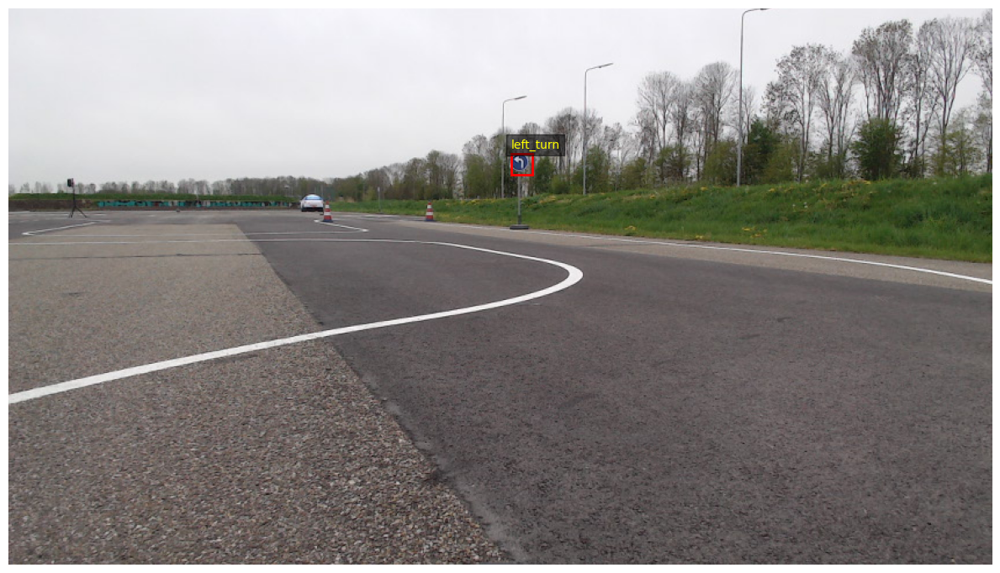

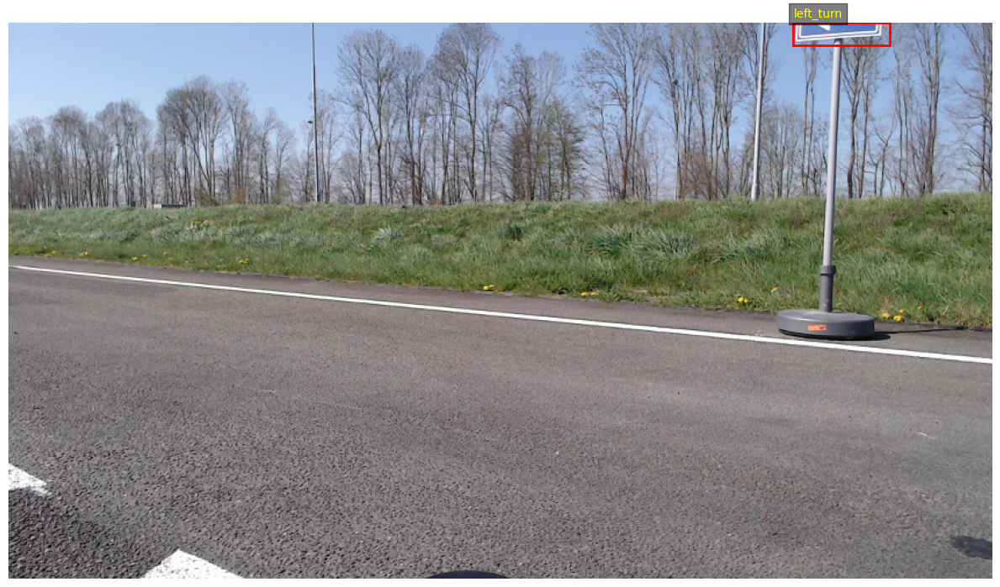

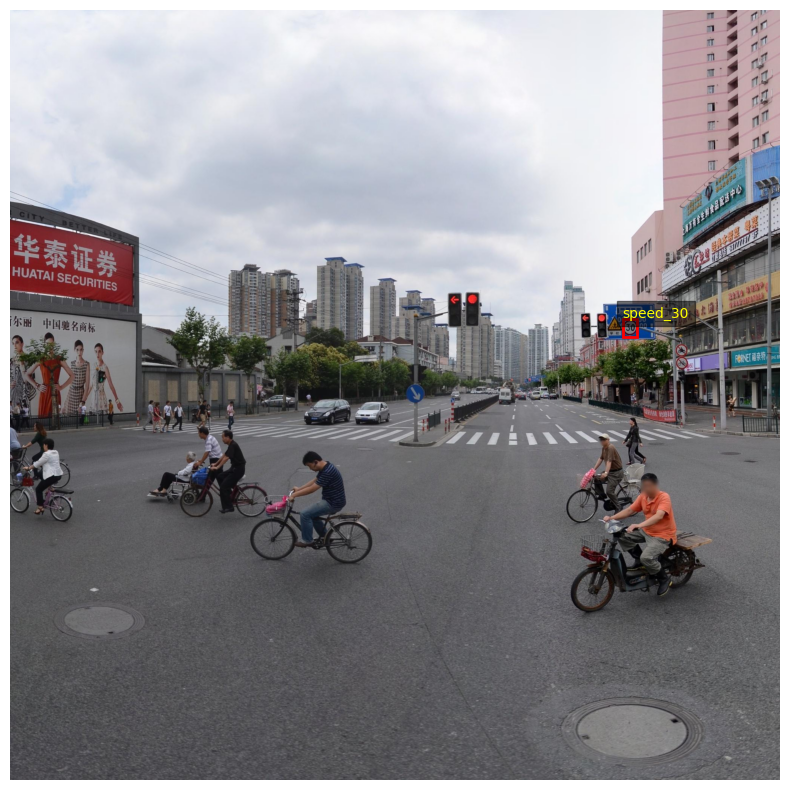

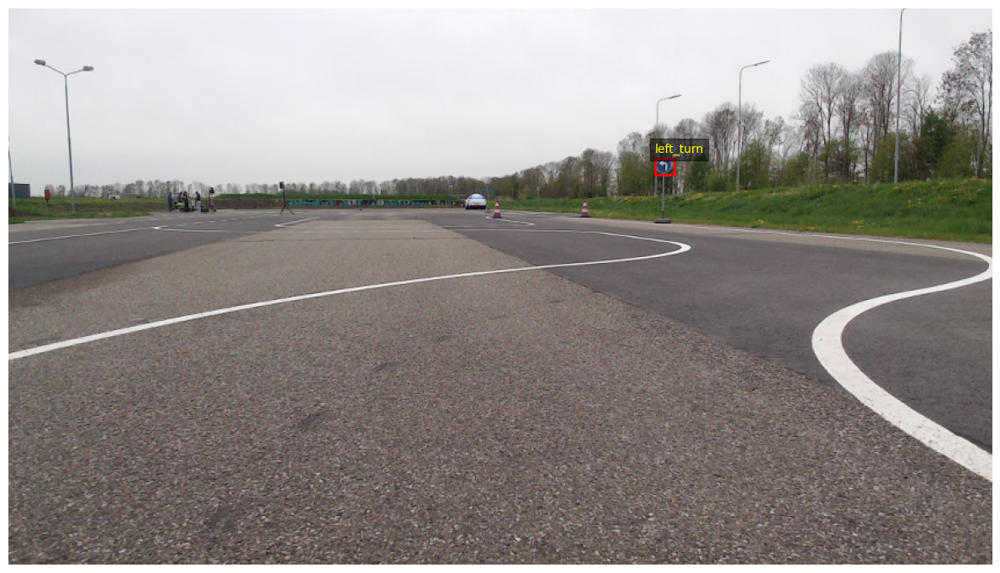

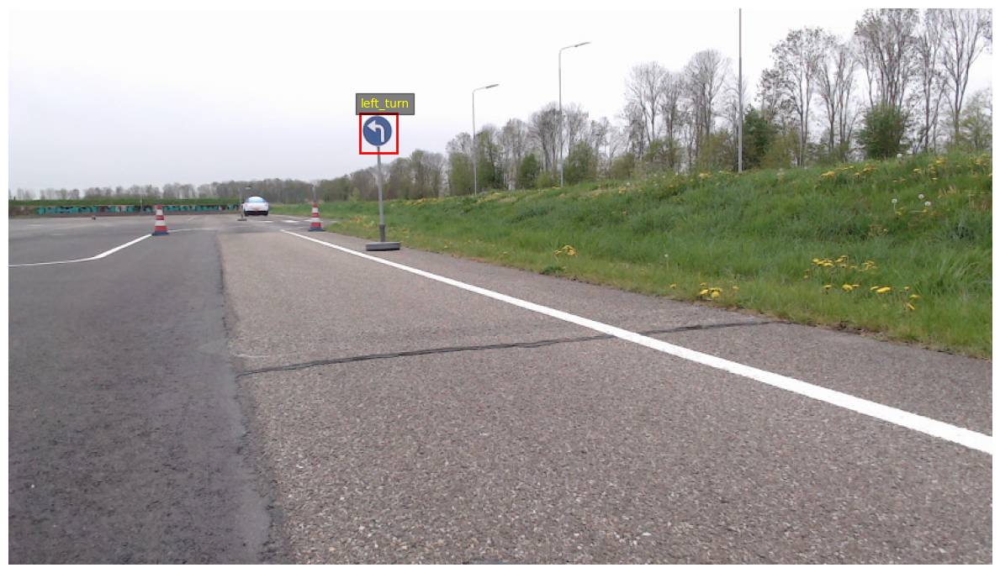

In [15]:
# -------------------------------------------------
# RANDOM SAMPLE VISUALIZATION
# -------------------------------------------------
image_files = [f for f in os.listdir(IMG_DIR) if f.endswith(".jpg") or f.endswith(".png")]

for _ in range(5):  # show 5 random samples

    img_file = random.choice(image_files)
    lbl_file = img_file.replace(".jpg", ".txt").replace(".png", ".txt")

    img_path = os.path.join(IMG_DIR, img_file)
    lbl_path = os.path.join(LBL_DIR, lbl_file)

    if os.path.exists(lbl_path):
        visualize(img_path, lbl_path)

In [21]:
import json

with open("coco/annotations/person_keypoints_train2017.json") as f:
    data = json.load(f)

print(data.keys())

dict_keys(['info', 'licenses', 'images', 'annotations', 'categories'])


In [22]:
import json
import os
from pathlib import Path
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split
import shutil

coco_json_path = "coco/annotations/instances_train2017.json"
images_dir = "coco/images/train2017"

output_dir = "coco_yolo"

with open(coco_json_path, "r") as f:
    coco = json.load(f)

images = coco["images"]
annotations = coco["annotations"]
categories = coco["categories"]

cat_id_to_index = {
    cat["id"]: idx for idx, cat in enumerate(categories)
}

img_to_anns = {}

for ann in annotations:
    if "bbox" not in ann:
        continue

    img_to_anns.setdefault(ann["image_id"], []).append(ann)


train_imgs, val_imgs = train_test_split(images, test_size=0.2, random_state=42)

for split in ["train", "val"]:
    os.makedirs(f"{output_dir}/images/{split}", exist_ok=True)
    os.makedirs(f"{output_dir}/labels/{split}", exist_ok=True)

def convert_bbox(size, bbox):
    dw = 1.0 / size[0]
    dh = 1.0 / size[1]

    x, y, w, h = bbox

    x_center = x + w / 2.0
    y_center = y + h / 2.0

    x_center *= dw
    y_center *= dh
    w *= dw
    h *= dh

    return x_center, y_center, w, h

def process(split_images, split_name):
    for img in tqdm(split_images):

        img_id = img["id"]
        file_name = img["file_name"]

        src_img_path = os.path.join(images_dir, file_name)

        dst_img_path = os.path.join(output_dir, "images", split_name, file_name)
        dst_label_path = os.path.join(
            output_dir,
            "labels",
            split_name,
            file_name.replace(".jpg", ".txt")
        )

        # copy image
        shutil.copy(src_img_path, dst_img_path)

        width, height = img["width"], img["height"]

        label_lines = []

        for ann in img_to_anns.get(img_id, []):
            bbox = ann["bbox"]
            class_id = cat_id_to_index[ann["category_id"]]

            yolo_bbox = convert_bbox((width, height), bbox)

            label_lines.append(f"{class_id} " + " ".join(map(str, yolo_bbox)))

        with open(dst_label_path, "w") as f:
            f.write("\n".join(label_lines))


process(train_imgs, "train")
process(val_imgs, "val")

100%|██████████| 23658/23658 [02:12<00:00, 178.42it/s]


In [ ]:
challenge_names = [
    "car",
    "stop sign",
    "traffic light",
    "person"
]
model = YOLO("yolo26n.pt")
print(model.names)

{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw

In [585]:
model = YOLO("yolo26n.pt")
results = model.train(data="fused_dataset/data.yaml", epochs=10, imgsz=640)

New https://pypi.org/project/ultralytics/8.4.53 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.51  Python-3.12.10 torch-2.12.0+cpu CPU (12th Gen Intel Core i7-12700K)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=fused_dataset/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=trai

In [8]:
from ultralytics import YOLO
model = YOLO("runs/detect/train/weights/best.pt")
model.predict(source="latest.mp4", save=True)


WARNING 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/5946) c:\Users\henry_f4yg7pl\Documents\GitHub\selfdriving\latest.mp4: 384x640 (no detections), 53.1ms
video 1/1 (frame 2/5946) c:\Users\henry_f4yg7pl\Documents\GitHub\selfdriving\latest.mp4: 384x640 (no detections), 25.0ms
video 1/1 (frame 3/5946) c:\Users\henry_f4yg7pl\Documents\GitHub\selfdriving\latest.mp4: 384x640 1 left_turn, 26.9ms
video 1/1 (frame 4/5946) c:\Users\henry_f4yg7pl\Documents\GitHub\selfdriving\latest.mp4: 384x640 1 lef

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'speed_10', 1: 'speed_20', 2: 'speed_30', 3: 'left_turn'}
 obb: None
 orig_img: array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         

--------------------

In [532]:
def coco_to_yolo(x, y, w, h, img_w, img_h):
    x_center = (x + w / 2) / img_w
    y_center = (y + h / 2) / img_h
    w_norm = w / img_w
    h_norm = h / img_h
    return x_center, y_center, w_norm, h_norm


for split in ["train", "val", "test"]:
    img_dir = f"dataset/images/{split}"
    lbl_dir = f"dataset/labels/{split}"

    if os.path.exists(img_dir):
        shutil.rmtree(img_dir)

    if os.path.exists(lbl_dir):
        shutil.rmtree(lbl_dir)

    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(lbl_dir, exist_ok=True)
    
    for sample in dataset[split]:

        image = Image.open(BytesIO(sample["image"]["bytes"]))
        img_w, img_h = image.size

        image_id = sample["image_id"]
        label_lines = []

        for obj in sample["objects"]:
            cls = obj["category"]

            if cls not in TARGET_MAP:
                continue

            new_cls = TARGET_MAP[cls]
            class_id = class_to_id[new_cls]

            # ✅ FIX: correct bbox format (x, y, w, h)
            x, y, w, h = obj["bbox"]

            # optional safety check
            if w <= 0 or h <= 0:
                continue

            x_center, y_center, w_norm, h_norm = coco_to_yolo(
                x, y, w, h,
                img_w, img_h
            )

            # optional clamp (prevents bad labels breaking YOLO)
            if not (0 <= x_center <= 1 and 0 <= y_center <= 1):
                continue

            label_lines.append(
                f"{class_id} {x_center} {y_center} {w_norm} {h_norm}"
            )

        if len(label_lines) == 0:
            continue

        # ensure directories exist
        os.makedirs(f"dataset/images/{split}", exist_ok=True)
        os.makedirs(f"dataset/labels/{split}", exist_ok=True)

        image.save(f"dataset/images/{split}/{image_id}.jpg")

        with open(f"dataset/labels/{split}/{image_id}.txt", "w") as f:
            f.write("\n".join(label_lines))

In [533]:
def load_labels(label_path):
    boxes = []
    if not os.path.exists(label_path):
        return boxes

    with open(label_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            cls = int(parts[0])
            x, y, w, h = map(float, parts[1:])
            boxes.append((cls, x, y, w, h))
    return boxes


def visualize_yolo(image_path, label_path):
    image = Image.open(image_path)
    img_w, img_h = image.size

    fig, ax = plt.subplots(1, figsize=(16, 10))
    ax.imshow(image)

    boxes = load_labels(label_path)

    for cls, x, y, w, h in boxes:
        # convert YOLO → pixel coords
        x_min = (x - w/2) * img_w
        y_min = (y - h/2) * img_h
        box_w = w * img_w
        box_h = h * img_h

        rect = patches.Rectangle(
            (x_min, y_min),
            box_w,
            box_h,
            linewidth=2,
            edgecolor='r',
            facecolor='none'
        )

        ax.add_patch(rect)

        ax.text(
            x_min,
            y_min,
            class_names[cls],
            color="red",
            # bbox=dict(facecolor="black", alpha=0.5)
        )

    plt.axis("off")
    plt.show()

In [534]:
from collections import Counter

counter = Counter()

for split in ["train", "val", "test"]:
    for sample in dataset[split]:
        for obj in sample["objects"]:
            cls = obj["category"]
            if cls in TARGET_MAP:
                counter[TARGET_MAP[cls]] += 1

print(counter)

Counter({'speed_30': 588, 'speed_20': 155, 'speed_10': 38, 'left_turn': 17})


In [ ]:
target_per_class = 200

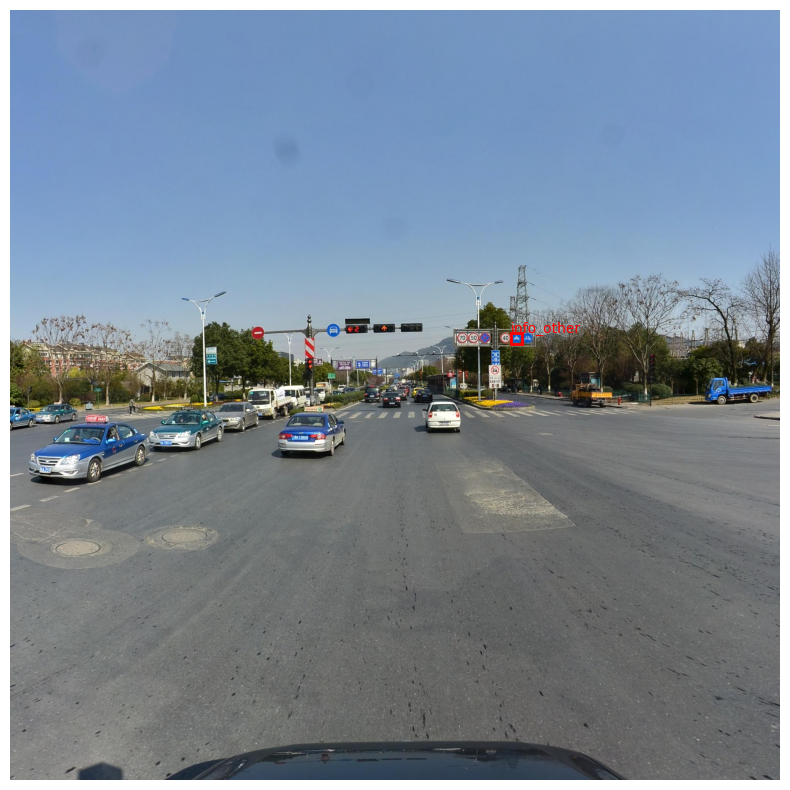

In [519]:
split = "train"

img_dir = f"dataset/images/{split}"
label_dir = f"dataset/labels/{split}"

image_file = random.choice(os.listdir(img_dir))

image_path = os.path.join(img_dir, image_file)
label_path = os.path.join(label_dir, image_file.replace(".jpg", ".txt"))

visualize_yolo(image_path, label_path)

In [6]:
yaml_content = f"""
path: dataset

train: images/train
val: images/val
test: images/test

names:
"""

for idx, cls in enumerate(all_classes):
    yaml_content += f"  {idx}: {cls}\n"

with open("dataset/data.yaml", "w") as f:
    f.write(yaml_content)

In [ ]:
model = YOLO("yolo26n.pt")

results = model.train(
    data="dataset/data.yaml",
    epochs=10,
    imgsz=640,
    batch=16,
    cache=True
)

New https://pypi.org/project/ultralytics/8.4.53 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.51  Python-3.12.10 torch-2.12.0+cpu CPU (12th Gen Intel Core i7-12700K)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train-3, nb

In [ ]:
FINAL_CLASSES = {
    "person": 0,
    "car": 1,
    "traffic_light": 2,
    "stop_sign": 3,
    "left_turn": 4,
    "speed_10": 5,
    "speed_20": 6,
    "speed_30": 7
    
}

# FINAL_CLASSES = {
#     "person": 0,
#     "car": 1,
#     "traffic_light": 2,
#     "stop_sign": 3,
#     "left_turn": 4,
#     "speed_limit": 5
# }

In [24]:
import cv2
import os

video_path = "latest.mp4"
output_folder = "sdc_2025"

os.makedirs(output_folder, exist_ok=True)

cap = cv2.VideoCapture(video_path)

frame_count = 0
save_every = 10  # save every 10th frame

while True:
    ret, frame = cap.read()

    if not ret:
        break

    if frame_count % save_every == 0:
        frame_path = os.path.join(output_folder, f"frame_{frame_count}.jpg")
        cv2.imwrite(frame_path, frame)

    frame_count += 1

cap.release()

print("Done!")

Done!


In [1]:
import os
import shutil

# Source folder containing images
source_folder = "right"

# Destination folder for every 20th image
destination_folder = "temp_img"

# Create destination folder if it doesn't exist
os.makedirs(destination_folder, exist_ok=True)

# Supported image extensions
image_extensions = (".jpg", ".jpeg", ".png", ".bmp", ".gif", ".webp")

# Get all image files and sort them
image_files = sorted([
    f for f in os.listdir(source_folder)
    if f.lower().endswith(image_extensions)
])

# Copy every 20th image
for i, image_name in enumerate(image_files):
    if i % 20 == 0:
        src_path = os.path.join(source_folder, image_name)
        dst_path = os.path.join(destination_folder, image_name)

        shutil.copy2(src_path, dst_path)
        print(f"Copied: {image_name}")

print("Done!")

Copied: 1776935126920347539.png
Copied: 1776935128801694195.png
Copied: 1776935129469901941.png
Copied: 1776935130137827628.png
Copied: 1776935130805710031.png
Copied: 1776935131473668862.png
Copied: 1776935132141680242.png
Copied: 1776935132809215227.png
Copied: 1776935133477570923.png
Copied: 1776935134145304837.png
Copied: 1776935134813152921.png
Copied: 1776935135477317458.png
Copied: 1776935136148988151.png
Copied: 1776935136813459291.png
Copied: 1776935137484964387.png
Copied: 1776935138152861139.png
Copied: 1776935138816829530.png
Copied: 1776935139491126205.png
Copied: 1776935140159060421.png
Copied: 1776935140826980158.png
Copied: 1776935141492771593.png
Copied: 1776935142160801932.png
Copied: 1776935142828518663.png
Copied: 1776935143496712560.png
Copied: 1776935144164762992.png
Copied: 1776935144832666481.png
Copied: 1776935145500639876.png
Copied: 1776935146172687805.png
Copied: 1776935146840646393.png
Copied: 1776935147508383953.png
Copied: 1776935148176700137.png
Copied: 

In [1]:
import fiftyone
dataset = fiftyone.zoo.load_zoo_dataset("coco-2017")

c:\Users\henry\Documents\GitHub\selfdriving\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


 100% |██████|    1.9Gb/1.9Gb [8.4s elapsed, 0s remaining, 257.3Mb/s]      
Extracting annotations to 'C:\Users\henry\fiftyone\coco-2017\raw\instances_train2017.json'
 100% |████|  144.1Gb/144.1Gb [10.3m elapsed, 0s remaining, 249.0Mb/s]      
Extracting images to 'C:\Users\henry\fiftyone\coco-2017\train\data'
Writing annotations to 'C:\Users\henry\fiftyone\coco-2017\train\labels.json'
Found annotations at 'C:\Users\henry\fiftyone\coco-2017\raw\instances_val2017.json'
 100% |██████|    6.1Gb/6.1Gb [24.8s elapsed, 0s remaining, 275.3Mb/s]      
Extracting images to 'C:\Users\henry\fiftyone\coco-2017\validation\data'
Writing annotations to 'C:\Users\henry\fiftyone\coco-2017\validation\labels.json'
 100% |██████|    8.7Mb/8.7Mb [578.6ms elapsed, 0s remaining, 15.1Mb/s]      
Extracting test info to 'C:\Users\henry\fiftyone\coco-2017\raw\image_info_test2017.json'
 100% |█████|   49.5Gb/49.5Gb [3.4m elapsed, 0s remaining, 273.8Mb/s]      
Extracting images to 'C:\Users\henry\fiftyone\coco-2

In [3]:
dataset.export(
    export_dir="coco_local",
    dataset_type=fiftyone.types.COCODetectionDataset,
    label_field="ground_truth",
)

print("Dataset saved to:", "coco_local")

   0% ||----------|      0/163957 [19.0ms elapsed, ? remaining, ? samples/s] 

 100% |███████████| 163957/163957 [21.4m elapsed, 0s remaining, 162.7 samples/s]      
Dataset saved to: coco_local
